# BCR analysis (on B cell object)

CVID, revisions

analysis with scirpy

18.02.2021: twins only, after reanalysis after bertie bug correction

In [1]:
import scirpy as ir # requires 'pip install scirpy'
import scanpy as sc
from glob import glob
import pandas as pd
import numpy as np
import tarfile
import anndata
import warnings
from numba import NumbaPerformanceWarning
import matplotlib.pyplot as plt

# ignore numba performance warnings
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

In [2]:
sc.settings.set_figure_params(dpi=100)


In [3]:
%%bash

pip freeze

aiohttp==3.6.2
airr==1.3.1
alembic==1.3.0
anndata==0.7.5
annoy==1.16.2
async-generator==1.10
async-timeout==3.0.1
attrs==19.3.0
backcall==0.1.0
bbknn==1.3.6
bleach==3.1.0
blinker==1.4
CellPhoneDB==2.1.5
certifi==2019.9.11
certipy==0.1.3
cffi==1.13.2
chardet==3.0.4
click==6.7
conda==4.7.12
conda-package-handling==1.6.0
cryptography==2.8
cycler==0.10.0
Cython==0.29.14
decorator==4.4.1
defusedxml==0.6.0
entrypoints==0.3
fbpca==1.0
geosketch==0.3
get-version==2.1
h5py==2.10.0
idna==2.7
imageio==2.9.0
importlib-metadata==0.23
intervaltree==2.1.0
ipykernel==5.1.3
ipython==7.9.0
ipython-genutils==0.2.0
jedi==0.15.1
Jinja2==2.10.3
joblib==0.14.0
json5==0.8.5
jsonschema==3.1.1
jupyter-client==5.3.3
jupyter-core==4.5.0
jupyter-rsession-proxy==1.0b6
jupyter-server-proxy==1.2.0
jupyterhub==1.0.0
jupyterlab==1.2.1
jupyterlab-server==1.0.6
kiwisolver==1.1.0
legacy-api-wrap==1.2
leidenalg==0.7.0
llvmlite==0.30.0
loompy==3.0.6
louvain==0.6.1
Mako==1.1.0
MarkupSafe==1.1.1
matplotlib==3.3.4
mistune==0.8

## Reading in the main transcriptomics object

In [4]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

In [5]:
# object with all cells, norm., log tr and scaled gex counts in .X, norm. and log tr. gex counts in .raw.X, HVG-subsetted
adata = sc.read(save_path+'adata_hvg_BBKNN_by_sample_nodoublets_B_cells_cleanup_final_manifold.h5ad')

In [6]:
adata

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'activation_colors', 'cell_type_colors', 'condition_colors', 'hvg', 'neighbors', 'pca', 'phase_colors', 'sample_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

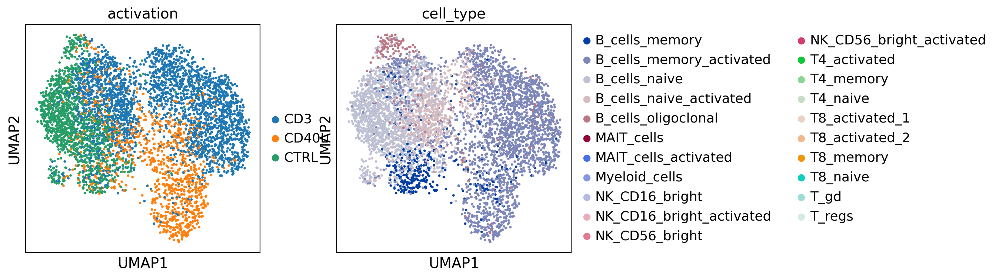

In [7]:
sc.pl.umap(adata, color=['activation','cell_type'])

In [8]:
np.unique(adata.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object)

### Loading data from cellranger output

#### general scRNA-seq

Immunodeficiency8103070          CVID_CTRL_Bcells

Immunodeficiency8103072          CVID_CD40L_Bcells

Immunodeficiency8103073          CVID_CD3_Bcells

Immunodeficiency8103074          CONTROL_CTRL_Bcells

Immunodeficiency8103076          CONTROL_CD40L_Bcells

Immunodeficiency8103077          CONTROL_CD3_Bcells

#### BCR enriched

Immunodeficiency8103054          CVID_CTRL_Bcells_B

Immunodeficiency8103056          CVID_CD40L_Bcells_B

Immunodeficiency8103057          CVID_CD3_Bcells_B

Immunodeficiency8103058          CONTROL_CTRL_Bcells_B

Immunodeficiency8103060          CONTROL_CD40L_Bcells_B

Immunodeficiency8103061          CONTROL_CD3_Bcells_B

In [9]:
samples_enriched = ['Immunodeficiency8103054',
                   'Immunodeficiency8103056',
                   'Immunodeficiency8103057',
                   'Immunodeficiency8103058',
                   'Immunodeficiency8103060',
                   'Immunodeficiency8103061']

In [10]:
np.unique(adata.obs['sample'])

array(['Immunodeficiency8103070', 'Immunodeficiency8103072',
       'Immunodeficiency8103073', 'Immunodeficiency8103074',
       'Immunodeficiency8103076', 'Immunodeficiency8103077'], dtype=object)

In [11]:
dict_samples_enrich_to_general =  {}

# BCR

dict_samples_enrich_to_general['Immunodeficiency8103054'] = 'Immunodeficiency8103070'
dict_samples_enrich_to_general['Immunodeficiency8103056'] = 'Immunodeficiency8103072'
dict_samples_enrich_to_general['Immunodeficiency8103057'] = 'Immunodeficiency8103073'
dict_samples_enrich_to_general['Immunodeficiency8103058'] = 'Immunodeficiency8103074'
dict_samples_enrich_to_general['Immunodeficiency8103060'] = 'Immunodeficiency8103076'
dict_samples_enrich_to_general['Immunodeficiency8103061'] = 'Immunodeficiency8103077'

In [12]:
list(dict_samples_enrich_to_general.keys())[:1]

['Immunodeficiency8103054']

In [13]:
%%time

# Create a list of AnnData objects (one for each sample)
adatas_gex_with_bcr = {}
for sample_bcr, sample_gex in dict_samples_enrich_to_general.items():
    
    print('gex sample', sample_gex)
    print('BCR sample', sample_bcr)
    
    gex_path = '/home/jovyan/notebooks/Vento_Lab/CVID/activation_matrices/filtered_feature_bc_matrix_' + sample_gex + '.h5'
    bcr_path = '/lustre/scratch117/cellgen/team292/aa22/data/CVID_related/cellranger_vdj_CVID_activation/' + sample_bcr + '/filtered_contig_annotations.csv'
    
    print('reading files')
    
    adata_gex = sc.read_10x_h5(gex_path)
    # remembering the unique barcode_sample index
    adata_gex.obs['barcode_sample'] = [barcode + '_' + sample_gex for barcode in adata_gex.obs_names]
    adata_bcr = ir.io.read_10x_vdj(bcr_path)
    
    print('merging gex and BCR adatas')
    
    ir.pp.merge_with_ir(adata_gex, adata_bcr)
    
    print('done merging')
    
    # concatenation only works with unique gene names
    adata_gex.var_names_make_unique()
    adatas_gex_with_bcr[sample_gex] = adata_gex


gex sample Immunodeficiency8103070
BCR sample Immunodeficiency8103054
reading files


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'IR_VJ_1_cdr3' as categorical
... storing 'IR_VJ_2_cdr3' as categorical
... storing 'IR_VDJ_1_cdr3' as categorical
... storing 'IR_VDJ_2_cdr3' as categorical
... storing 'IR_VJ_1_cdr3_nt' as categorical
... storing 'IR_VJ_2_cdr3_nt' as categorical
... storing 'IR_VDJ_1_cdr3_nt' as categorical
... storing 'IR_VDJ_2_cdr3_nt' as categorical
... storing 'IR_VJ_1_junction_ins' as categorical
... storing 'IR_VJ_2_junction_ins' as categorical
... storing 'IR_VDJ_1_junction_ins' as categorical
... storing 'IR_VDJ_2_junction_ins' as categorical
... storing 'multi_chain' as categorical


merging gex and BCR adatas


... storing 'feature_types' as categorical
... storing 'genome' as categorical


done merging
gex sample Immunodeficiency8103072
BCR sample Immunodeficiency8103056
reading files


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'IR_VJ_1_cdr3' as categorical
... storing 'IR_VJ_2_cdr3' as categorical
... storing 'IR_VDJ_1_cdr3' as categorical
... storing 'IR_VDJ_2_cdr3' as categorical
... storing 'IR_VJ_1_cdr3_nt' as categorical
... storing 'IR_VJ_2_cdr3_nt' as categorical
... storing 'IR_VDJ_1_cdr3_nt' as categorical
... storing 'IR_VDJ_2_cdr3_nt' as categorical
... storing 'IR_VJ_1_junction_ins' as categorical
... storing 'IR_VJ_2_junction_ins' as categorical
... storing 'IR_VDJ_1_junction_ins' as categorical
... storing 'IR_VDJ_2_junction_ins' as categorical
... storing 'multi_chain' as categorical


merging gex and BCR adatas


... storing 'feature_types' as categorical
... storing 'genome' as categorical


done merging
gex sample Immunodeficiency8103073
BCR sample Immunodeficiency8103057
reading files


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'IR_VJ_1_cdr3' as categorical
... storing 'IR_VJ_2_cdr3' as categorical
... storing 'IR_VDJ_1_cdr3' as categorical
... storing 'IR_VDJ_2_cdr3' as categorical
... storing 'IR_VJ_1_cdr3_nt' as categorical
... storing 'IR_VJ_2_cdr3_nt' as categorical
... storing 'IR_VDJ_1_cdr3_nt' as categorical
... storing 'IR_VDJ_2_cdr3_nt' as categorical
... storing 'IR_VJ_1_junction_ins' as categorical
... storing 'IR_VJ_2_junction_ins' as categorical
... storing 'IR_VDJ_1_junction_ins' as categorical
... storing 'IR_VDJ_2_junction_ins' as categorical
... storing 'multi_chain' as categorical


merging gex and BCR adatas


... storing 'feature_types' as categorical
... storing 'genome' as categorical
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


done merging
gex sample Immunodeficiency8103074
BCR sample Immunodeficiency8103058
reading files


... storing 'IR_VJ_1_cdr3' as categorical
... storing 'IR_VJ_2_cdr3' as categorical
... storing 'IR_VDJ_1_cdr3' as categorical
... storing 'IR_VDJ_2_cdr3' as categorical
... storing 'IR_VJ_1_cdr3_nt' as categorical
... storing 'IR_VJ_2_cdr3_nt' as categorical
... storing 'IR_VDJ_1_cdr3_nt' as categorical
... storing 'IR_VDJ_2_cdr3_nt' as categorical
... storing 'IR_VJ_1_junction_ins' as categorical
... storing 'IR_VJ_2_junction_ins' as categorical
... storing 'IR_VDJ_1_junction_ins' as categorical
... storing 'IR_VDJ_2_junction_ins' as categorical
... storing 'multi_chain' as categorical


merging gex and BCR adatas


... storing 'feature_types' as categorical
... storing 'genome' as categorical


done merging
gex sample Immunodeficiency8103076
BCR sample Immunodeficiency8103060
reading files


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'IR_VJ_1_cdr3' as categorical
... storing 'IR_VJ_2_cdr3' as categorical
... storing 'IR_VDJ_1_cdr3' as categorical
... storing 'IR_VDJ_2_cdr3' as categorical
... storing 'IR_VJ_1_cdr3_nt' as categorical
... storing 'IR_VJ_2_cdr3_nt' as categorical
... storing 'IR_VDJ_1_cdr3_nt' as categorical
... storing 'IR_VDJ_2_cdr3_nt' as categorical
... storing 'IR_VJ_1_junction_ins' as categorical
... storing 'IR_VJ_2_junction_ins' as categorical
... storing 'IR_VDJ_1_junction_ins' as categorical
... storing 'IR_VDJ_2_junction_ins' as categorical
... storing 'multi_chain' as categorical


merging gex and BCR adatas


... storing 'feature_types' as categorical
... storing 'genome' as categorical


done merging
gex sample Immunodeficiency8103077
BCR sample Immunodeficiency8103061
reading files


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
... storing 'IR_VJ_1_cdr3' as categorical
... storing 'IR_VJ_2_cdr3' as categorical
... storing 'IR_VDJ_1_cdr3' as categorical
... storing 'IR_VDJ_2_cdr3' as categorical
... storing 'IR_VJ_1_cdr3_nt' as categorical
... storing 'IR_VJ_2_cdr3_nt' as categorical
... storing 'IR_VDJ_1_cdr3_nt' as categorical
... storing 'IR_VDJ_2_cdr3_nt' as categorical
... storing 'IR_VJ_1_junction_ins' as categorical
... storing 'IR_VJ_2_junction_ins' as categorical
... storing 'IR_VDJ_1_junction_ins' as categorical
... storing 'IR_VDJ_2_junction_ins' as categorical


merging gex and BCR adatas


... storing 'multi_chain' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


done merging
CPU times: user 20.7 s, sys: 332 ms, total: 21.1 s
Wall time: 21.5 s


In [14]:
# Merge anndata objects
adata_with_bcr = list(adatas_gex_with_bcr.values())[0].concatenate(list(adatas_gex_with_bcr.values())[1:])

In [15]:
adata_with_bcr

AnnData object with n_obs × n_vars = 19023 × 33694
    obs: 'barcode_sample', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_VJ_2_cdr3_nt', 'IR_VDJ_1_cdr3_nt', 'IR_VDJ_2_cdr3_nt', 'IR_VJ_1_expr', 'IR_VJ_2_expr', 'IR_VDJ_1_expr', 'IR_VDJ_2_expr', 'IR_VJ_1_expr_raw', 'IR_VJ_2_expr_raw', 'IR_VDJ_1_expr_raw', 'IR_VDJ_2_expr_raw', 'IR_VJ_1_v_gene', 'IR_VJ_2_v_gene', 'IR_VDJ_1_v_gene', 'IR_VDJ_2_v_gene', 'IR_VJ_1_d_gene', 'IR_VJ_2_d_gene', 'IR_VDJ_1_d_gene', 'IR_VDJ_2_d_gene', 'IR_VJ_1_j_gene', 'IR_VJ_2_j_gene', 'IR_VDJ_1_j_gene', 'IR_VDJ_2_j_gene', 'IR_VJ_1_c_gene', 'IR_VJ_2_c_gene', 'IR_VDJ_1_c_gene', 'IR_VDJ_2_c_gene', 'IR_VJ_1_junction_ins', 'IR_VJ_2_junction_ins', 'IR_VDJ_1_junction_ins', 'IR_VDJ_2_junction_ins', 'has_ir', 'multi_chain', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [16]:
adata_with_bcr.obs

,barcode_sample,IR_VJ_1_locus,IR_VJ_2_locus,IR_VDJ_1_locus,IR_VDJ_2_locus,IR_VJ_1_cdr3,IR_VJ_2_cdr3,IR_VDJ_1_cdr3,IR_VDJ_2_cdr3,IR_VJ_1_cdr3_nt,...,IR_VJ_2_c_gene,IR_VDJ_1_c_gene,IR_VDJ_2_c_gene,IR_VJ_1_junction_ins,IR_VJ_2_junction_ins,IR_VDJ_1_junction_ins,IR_VDJ_2_junction_ins,has_ir,multi_chain,batch
AAACCTGCAGACAAGC-1-0,AAACCTGCAGACAAGC-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACCTGCATGTTCCC-1-0,AAACCTGCATGTTCCC-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACCTGGTCTCTCTG-1-0,AAACCTGGTCTCTCTG-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACCTGTCGAACTGT-1-0,AAACCTGTCGAACTGT-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACGGGAGATGAGAG-1-0,AAACGGGAGATGAGAG-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACATGGTCAT-1-5,TTTGTCACATGGTCAT-1_Immunodeficiency8103077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,5
TTTGTCAGTAAATGTG-1-5,TTTGTCAGTAAATGTG-1_Immunodeficiency8103077,IGK,NaN,IGH,NaN,CQQYNSYSRTF,None,CARSHTEAVGSYW,None,TGCCAACAGTATAATAGTTATTCAAGAACGTTC,...,NaN,IGHM,NaN,None,None,None,None,True,False,5
TTTGTCAGTATCTGCA-1-5,TTTGTCAGTATCTGCA-1_Immunodeficiency8103077,IGL,NaN,NaN,NaN,CSSYAGSNNFVVF,None,None,None,TGCAGCTCATATGCAGGCAGCAACAATTTCGTGGTATTC,...,NaN,NaN,NaN,None,None,None,None,True,False,5
TTTGTCAGTCAATACC-1-5,TTTGTCAGTCAATACC-1_Immunodeficiency8103077,IGK,NaN,IGH,NaN,CQQSYSTPLTF,None,CARGGSYYYYYMDVW,None,TGTCAACAGAGTTACAGTACCCCTCTCACTTTC,...,NaN,IGHM,NaN,None,None,None,None,True,False,5


In [17]:
BCR_table = adata_with_bcr.obs.set_index('barcode_sample', drop=True)

In [18]:
BCR_table

,IR_VJ_1_locus,IR_VJ_2_locus,IR_VDJ_1_locus,IR_VDJ_2_locus,IR_VJ_1_cdr3,IR_VJ_2_cdr3,IR_VDJ_1_cdr3,IR_VDJ_2_cdr3,IR_VJ_1_cdr3_nt,IR_VJ_2_cdr3_nt,...,IR_VJ_2_c_gene,IR_VDJ_1_c_gene,IR_VDJ_2_c_gene,IR_VJ_1_junction_ins,IR_VJ_2_junction_ins,IR_VDJ_1_junction_ins,IR_VDJ_2_junction_ins,has_ir,multi_chain,batch
barcode_sample,,,,,,,,,,,,,,,,,,,,,
AAACCTGCAGACAAGC-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACCTGCATGTTCCC-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACCTGGTCTCTCTG-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACCTGTCGAACTGT-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
AAACGGGAGATGAGAG-1_Immunodeficiency8103070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACATGGTCAT-1_Immunodeficiency8103077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,nan,5
TTTGTCAGTAAATGTG-1_Immunodeficiency8103077,IGK,NaN,IGH,NaN,CQQYNSYSRTF,None,CARSHTEAVGSYW,None,TGCCAACAGTATAATAGTTATTCAAGAACGTTC,None,...,NaN,IGHM,NaN,None,None,None,None,True,False,5
TTTGTCAGTATCTGCA-1_Immunodeficiency8103077,IGL,NaN,NaN,NaN,CSSYAGSNNFVVF,None,None,None,TGCAGCTCATATGCAGGCAGCAACAATTTCGTGGTATTC,None,...,NaN,NaN,NaN,None,None,None,None,True,False,5


In [19]:
# adding all the BCR info to the final adata object .obs table

def add_BCR_info(adata_obj, barcode_sample, column):
    
    if barcode_sample in BCR_table.index:
        value = BCR_table.loc[barcode_sample, column]
        return(value)
    else:
        return('none')

In [20]:
%%time

# adding BCR data to adata.obs table

for col in BCR_table.columns:
    print(col)
    adata.obs[col] = adata.obs['barcode_sample'].apply(lambda x: add_BCR_info(adata, x, column=col))

IR_VJ_1_locus
IR_VJ_2_locus
IR_VDJ_1_locus
IR_VDJ_2_locus
IR_VJ_1_cdr3
IR_VJ_2_cdr3
IR_VDJ_1_cdr3
IR_VDJ_2_cdr3
IR_VJ_1_cdr3_nt
IR_VJ_2_cdr3_nt
IR_VDJ_1_cdr3_nt
IR_VDJ_2_cdr3_nt
IR_VJ_1_expr
IR_VJ_2_expr
IR_VDJ_1_expr
IR_VDJ_2_expr
IR_VJ_1_expr_raw
IR_VJ_2_expr_raw
IR_VDJ_1_expr_raw
IR_VDJ_2_expr_raw
IR_VJ_1_v_gene
IR_VJ_2_v_gene
IR_VDJ_1_v_gene
IR_VDJ_2_v_gene
IR_VJ_1_d_gene
IR_VJ_2_d_gene
IR_VDJ_1_d_gene
IR_VDJ_2_d_gene
IR_VJ_1_j_gene
IR_VJ_2_j_gene
IR_VDJ_1_j_gene
IR_VDJ_2_j_gene
IR_VJ_1_c_gene
IR_VJ_2_c_gene
IR_VDJ_1_c_gene
IR_VDJ_2_c_gene
IR_VJ_1_junction_ins
IR_VJ_2_junction_ins
IR_VDJ_1_junction_ins
IR_VDJ_2_junction_ins
has_ir
multi_chain
batch
CPU times: user 2.12 s, sys: 4 ms, total: 2.12 s
Wall time: 2.12 s


In [21]:
ir.tl.chain_qc(adata)


In [22]:
adata

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_VJ_2_cdr3_nt', 'IR_VDJ_1_cdr3_nt', 'IR_VDJ_2_cdr3_nt', 'IR_VJ_1_expr', 'IR_VJ_2_expr', 'IR_VDJ_1_expr', 'IR_VDJ_2_expr', 'IR_VJ_1_expr_raw', 'IR_VJ_2_expr_raw', 'IR_VDJ_1_expr_raw', 'IR_VDJ_2_expr_raw', 'IR_VJ_1_v_gene', 'IR_VJ_2_v_gene', 'IR_VDJ_1_v_gene', 'IR_VDJ_2_v_gene', 'IR_VJ_1_d_gene', 'IR_VJ_2_d_gene', 'IR_VDJ_1_d_gene', 'IR_VDJ_2_d_gene', 'IR_VJ_1_j_gene', 'IR_VJ_2_j_gene', 'IR_VDJ_1_j_gene', 'IR_VDJ_2_j_gene', 'IR_VJ_1_c_gene', 'IR_VJ_2_c_gene', 'IR_VDJ_1_c_gene', 'IR_VDJ_2_c_gene', 'IR_VJ_1_junction_ins', 'IR_VJ_2_junction_ins', 'IR_V

In [23]:
np.unique(adata.obs['condition'])

array(['CONTROL', 'CVID'], dtype=object)

In [24]:
np.unique(adata.obs['cell_type'])

array(['B_cells_memory', 'B_cells_memory_activated', 'B_cells_naive',
       'B_cells_naive_activated', 'B_cells_oligoclonal'], dtype=object)

In [25]:
# ading a joint key of celltype + condition
adata.obs['celltype_condition'] = [i + '_' + j for i,j in zip(adata.obs['cell_type'], adata.obs['condition'])]

<AxesSubplot:title={'center':'Number of cells in receptor_subtype by condition'}, xlabel='receptor_subtype', ylabel='Number of cells'>

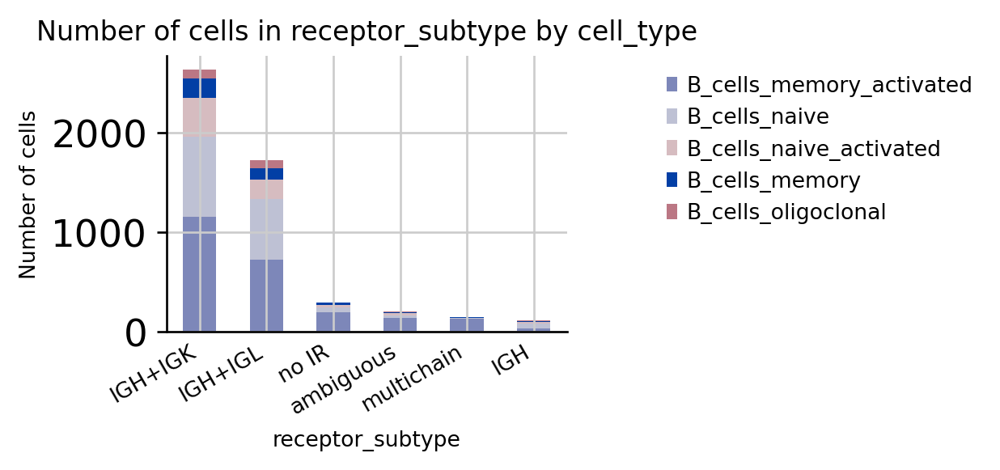

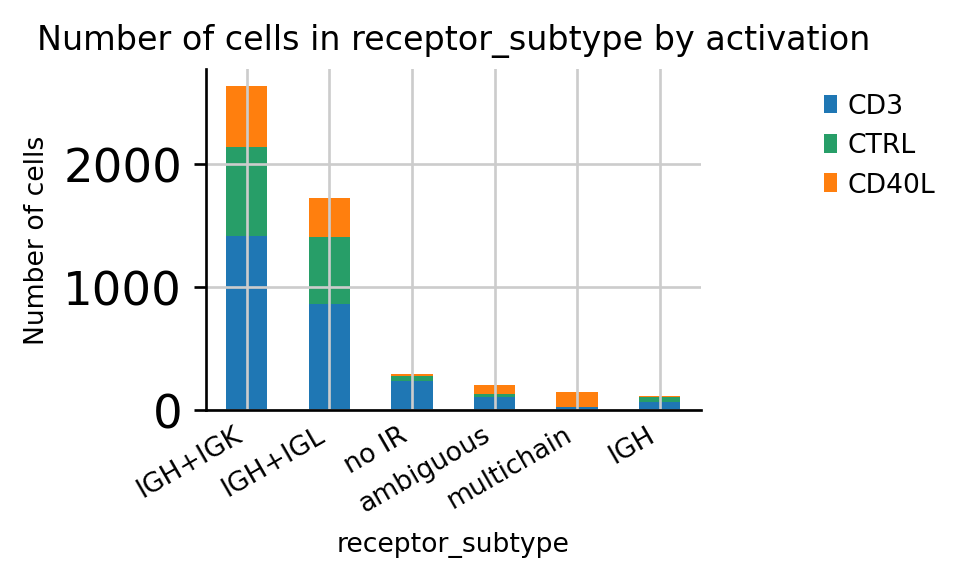

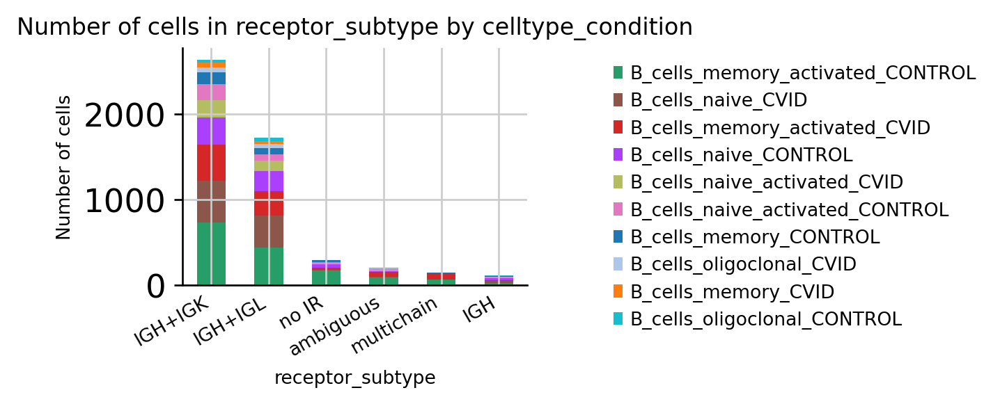

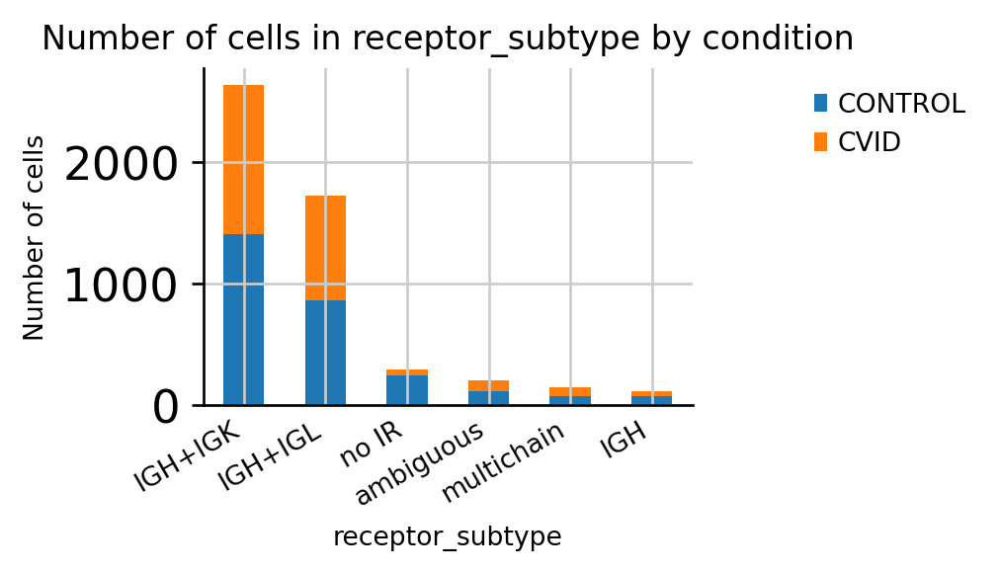

In [28]:
ir.pl.group_abundance(adata, groupby="receptor_subtype", target_col="cell_type")
ir.pl.group_abundance(adata, groupby="receptor_subtype", target_col="activation")
ir.pl.group_abundance(adata, groupby="receptor_subtype", target_col="celltype_condition")
ir.pl.group_abundance(adata, groupby="receptor_subtype", target_col="condition")


In [29]:
adata

AnnData object with n_obs × n_vars = 5119 × 2693
    obs: 'activation', 'barcode_sample', 'batch', 'bh_pval', 'condition', 'n_counts', 'n_genes', 'percent_mito', 'sample', 'scrublet_cluster_score', 'scrublet_score', 'technique', 'is_doublet', 'S_score', 'G2M_score', 'phase', 'cell_type', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 'IR_VJ_2_cdr3_nt', 'IR_VDJ_1_cdr3_nt', 'IR_VDJ_2_cdr3_nt', 'IR_VJ_1_expr', 'IR_VJ_2_expr', 'IR_VDJ_1_expr', 'IR_VDJ_2_expr', 'IR_VJ_1_expr_raw', 'IR_VJ_2_expr_raw', 'IR_VDJ_1_expr_raw', 'IR_VDJ_2_expr_raw', 'IR_VJ_1_v_gene', 'IR_VJ_2_v_gene', 'IR_VDJ_1_v_gene', 'IR_VDJ_2_v_gene', 'IR_VJ_1_d_gene', 'IR_VJ_2_d_gene', 'IR_VDJ_1_d_gene', 'IR_VDJ_2_d_gene', 'IR_VJ_1_j_gene', 'IR_VJ_2_j_gene', 'IR_VDJ_1_j_gene', 'IR_VDJ_2_j_gene', 'IR_VJ_1_c_gene', 'IR_VJ_2_c_gene', 'IR_VDJ_1_c_gene', 'IR_VDJ_2_c_gene', 'IR_VJ_1_junction_ins', 'IR_VJ_2_junction_ins', 'IR_V

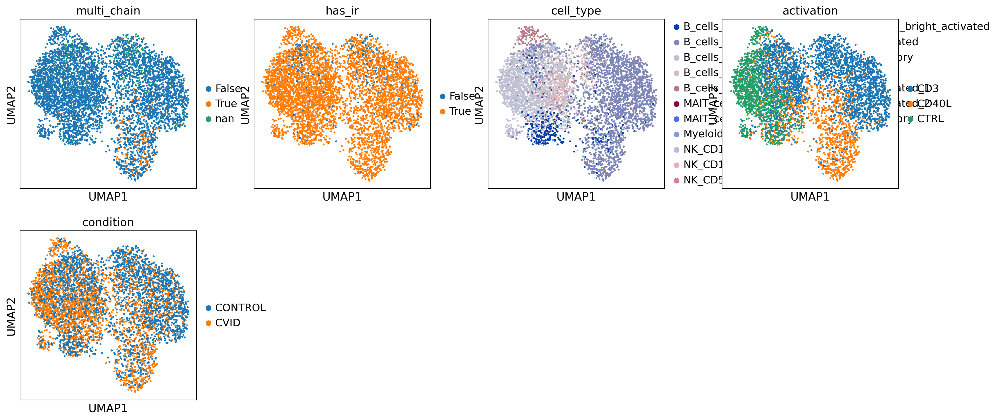

In [30]:
sc.pl.umap(adata, color=['multi_chain','has_ir','cell_type','activation','condition'])


# Define clonotypes and clonotype clusters


### Compute CDR3 neighborhood graph and define clonotypes


In [31]:
# using default parameters, `ir_neighbors` will compute nucleotide sequence identity
ir.pp.ir_neighbors(adata, receptor_arms="all", dual_ir="primary_only")
ir.tl.define_clonotypes(adata)

100%|██████████| 27444/27444 [00:00<00:00, 123283.40it/s]


... storing 'clonotype' as categorical


array([<AxesSubplot:title={'center':'clonotype'}, xlabel='clonotype_network1', ylabel='clonotype_network2'>],
      dtype=object)

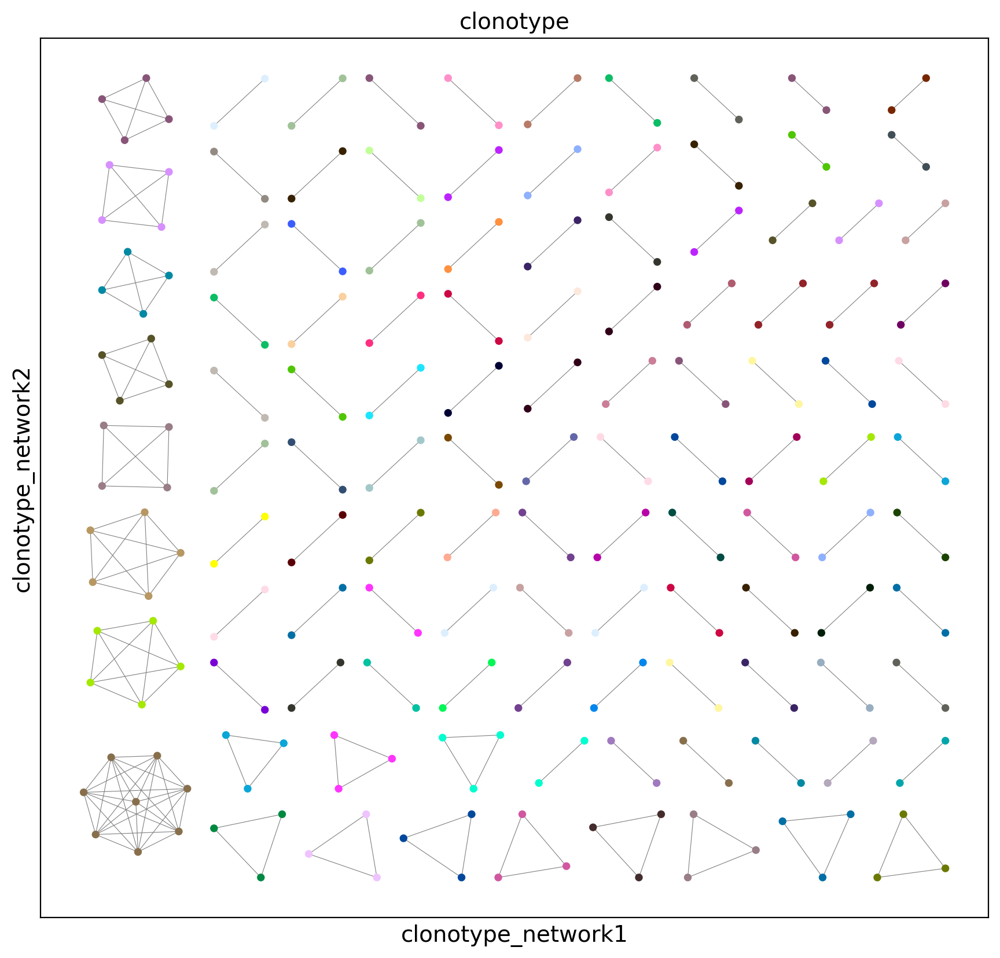

In [32]:
ir.tl.clonotype_network(adata, min_size=2)
ir.pl.clonotype_network(adata, color="clonotype", legend_loc="none")

## Re-compute CDR3 neighborhood graph and define clonotype clusters


In [34]:
ir.pp.ir_neighbors(
    adata,
    metric="alignment",
    sequence="aa",
    cutoff=15,
    receptor_arms="all",
    dual_ir="all",
)
ir.tl.define_clonotype_clusters(
    adata, partitions="connected", sequence="aa", metric="alignment", within_group=None
)

100%|██████████| 819386/819386 [00:03<00:00, 206686.40it/s]


In [35]:
ir.tl.clonotype_network(adata, min_size=4, sequence="aa", metric="alignment")


... storing 'ct_cluster_aa_alignment' as categorical


array([<AxesSubplot:title={'center':'ct_cluster_aa_alignment'}, xlabel='clonotype_network1', ylabel='clonotype_network2'>],
      dtype=object)

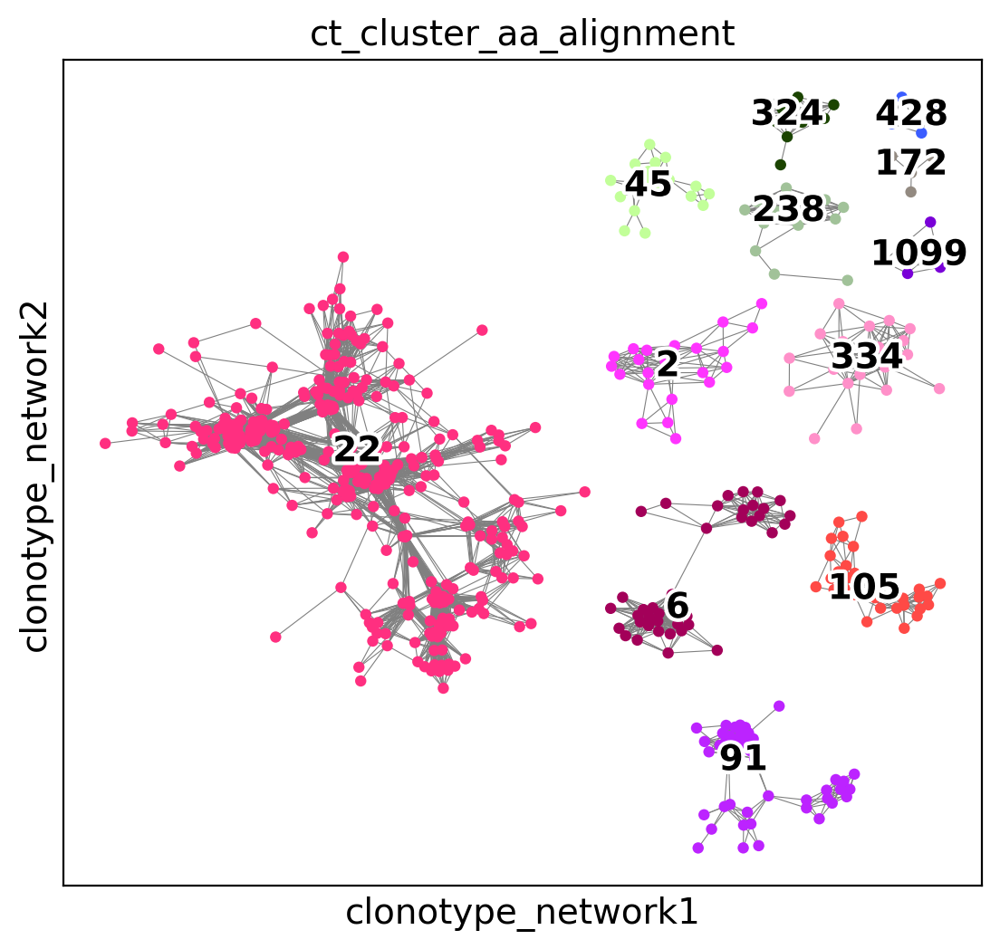

In [36]:
ir.pl.clonotype_network(
    adata,
    color="ct_cluster_aa_alignment",
    legend_fontoutline=3,
    size=80,
    panel_size=(6, 6),
    legend_loc="on data",
)

array([<AxesSubplot:title={'center':'condition'}, xlabel='clonotype_network1', ylabel='clonotype_network2'>],
      dtype=object)

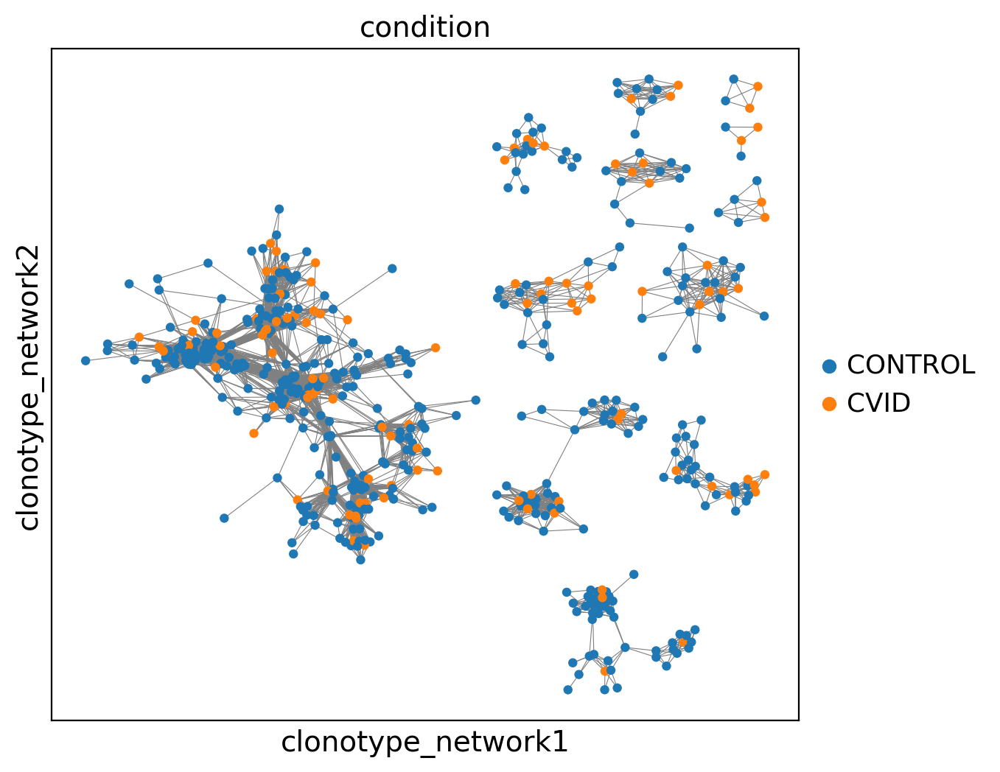

In [38]:
# to rerun
ir.pl.clonotype_network(adata, color="condition", size=80, panel_size=(6, 6))


array([<AxesSubplot:title={'center':'cell_type'}, xlabel='clonotype_network1', ylabel='clonotype_network2'>],
      dtype=object)

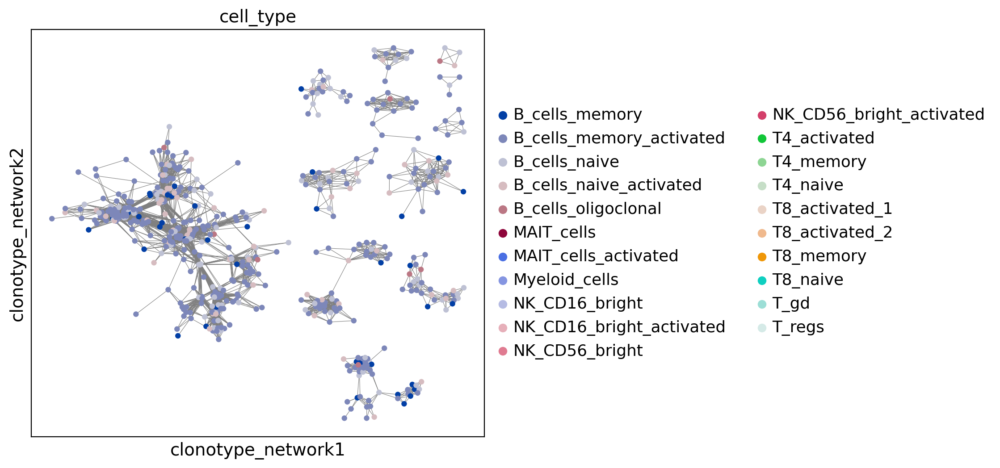

In [39]:
# to rerun
ir.pl.clonotype_network(adata, color="cell_type", size=80, panel_size=(6, 6))


array([<AxesSubplot:title={'center':'activation'}, xlabel='clonotype_network1', ylabel='clonotype_network2'>],
      dtype=object)

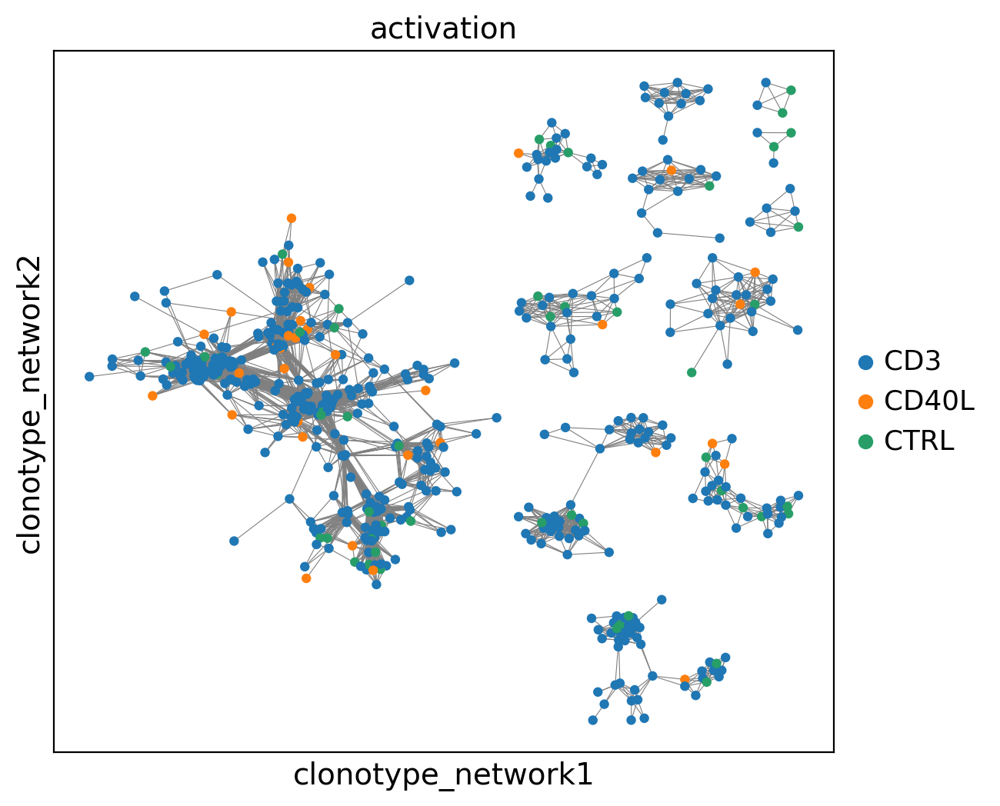

In [40]:
# to rerun
ir.pl.clonotype_network(adata, color="activation", size=80, panel_size=(6, 6))


array([<AxesSubplot:title={'center':'celltype_condition'}, xlabel='clonotype_network1', ylabel='clonotype_network2'>],
      dtype=object)

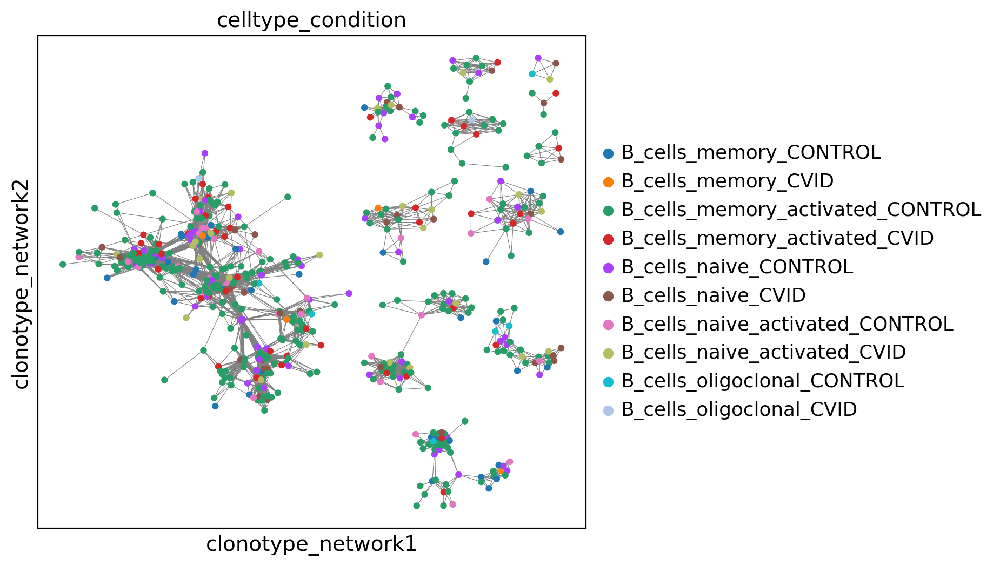

In [41]:
# to rerun
ir.pl.clonotype_network(adata, color="celltype_condition", size=80, panel_size=(6, 6))


In [42]:
adata.obs.loc[
    adata.obs["ct_cluster_aa_alignment"] == "117",
    [
        "IR_VJ_1_cdr3",
        "IR_VJ_2_cdr3",
        "IR_VDJ_1_cdr3",
        "IR_VDJ_2_cdr3",
        "receptor_subtype",
    ],
]

,IR_VJ_1_cdr3,IR_VJ_2_cdr3,IR_VDJ_1_cdr3,IR_VDJ_2_cdr3,receptor_subtype
index,,,,,
GCTGCGAAGGGATCTG-1,CQQANSFPWTF,None,CARSKRYCSGGSCYRRYYYYGMDVW,None,IGH+IGK
AACTGGTTCAACGGGA-1,CQQANSFPWTF,None,CARSKRYCSGGSCYRRYYYYGMDVW,None,IGH+IGK


## Including the V-gene in clonotype definition


In [43]:
ir.tl.define_clonotype_clusters(
    adata,
    sequence="aa",
    metric="alignment",
    same_v_gene="primary_only",
    key_added="ct_cluster_aa_alignment_same_v",
)

In [44]:
# find clonotypes with more than one `clonotype_same_v`
ct_different_v = adata.obs.groupby("ct_cluster_aa_alignment").apply(
    lambda x: x["ct_cluster_aa_alignment_same_v"].unique().size > 1
)
ct_different_v = ct_different_v[ct_different_v].index.values
ct_different_v

[2, 6, 22, 45, 91, ..., 645, 1271, 2048, 3303, 3527]
Length: 16
Categories (4530, object): [0, 1, 2, 3, ..., 4526, 4527, 4528, 4529]

In [45]:
# Display the first 2 clonotypes with different v genes
adata.obs.loc[
    adata.obs["ct_cluster_aa_alignment"].isin(ct_different_v[:2]),
    [
        "ct_cluster_aa_alignment",
        "ct_cluster_aa_alignment_same_v",
        "IR_VJ_1_v_gene",
        "IR_VDJ_1_v_gene",
    ],
].sort_values("ct_cluster_aa_alignment").drop_duplicates().reset_index(drop=True)

,ct_cluster_aa_alignment,ct_cluster_aa_alignment_same_v,IR_VJ_1_v_gene,IR_VDJ_1_v_gene
0,2,2_IGLV1-40_nan_BCR,IGLV1-40,nan
1,2,2_IGLV6-57_nan_BCR,IGLV6-57,nan
2,6,6_IGLV3-21_nan_BCR,IGLV3-21,nan
3,6,6_IGLV3-1_nan_BCR,IGLV3-1,nan
4,6,6_IGLV6-57_nan_BCR,IGLV6-57,nan


# Clonotype analysis


### Clonal expansion


In [48]:
ir.tl.clonal_expansion(adata)

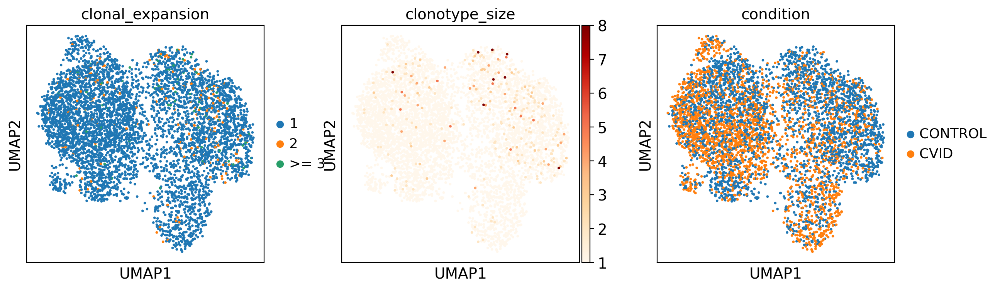

In [50]:
sc.pl.umap(adata, color=["clonal_expansion", "clonotype_size",'condition'], cmap='OrRd')


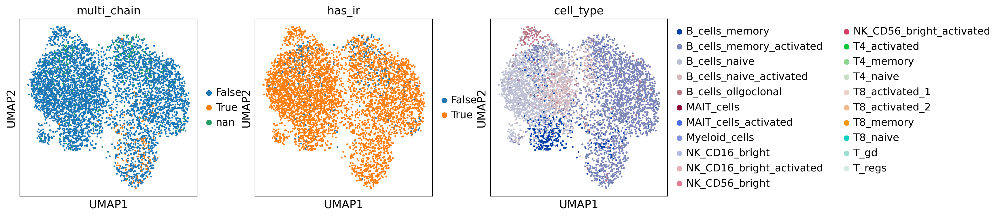

In [51]:
sc.pl.umap(adata, color=["multi_chain", "has_ir",'cell_type'], cmap='OrRd',
          size=20)


<AxesSubplot:>

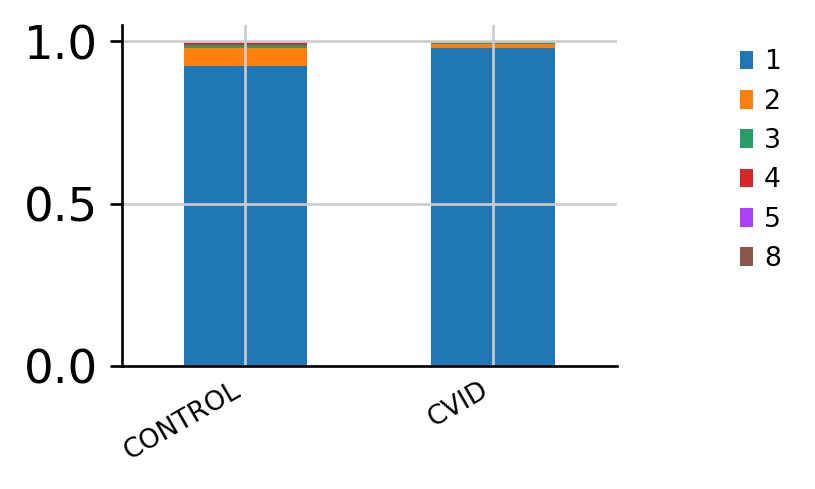

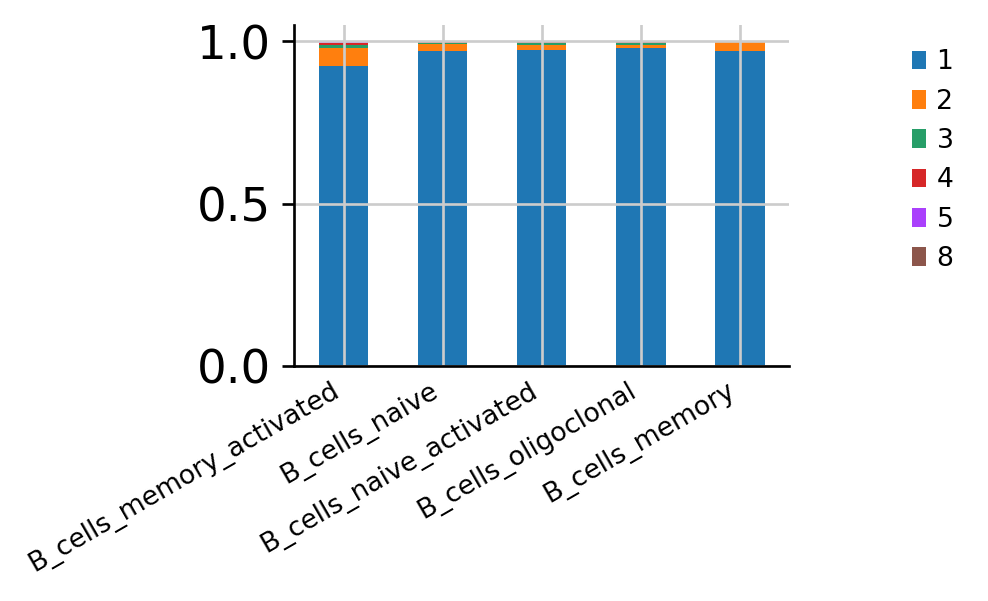

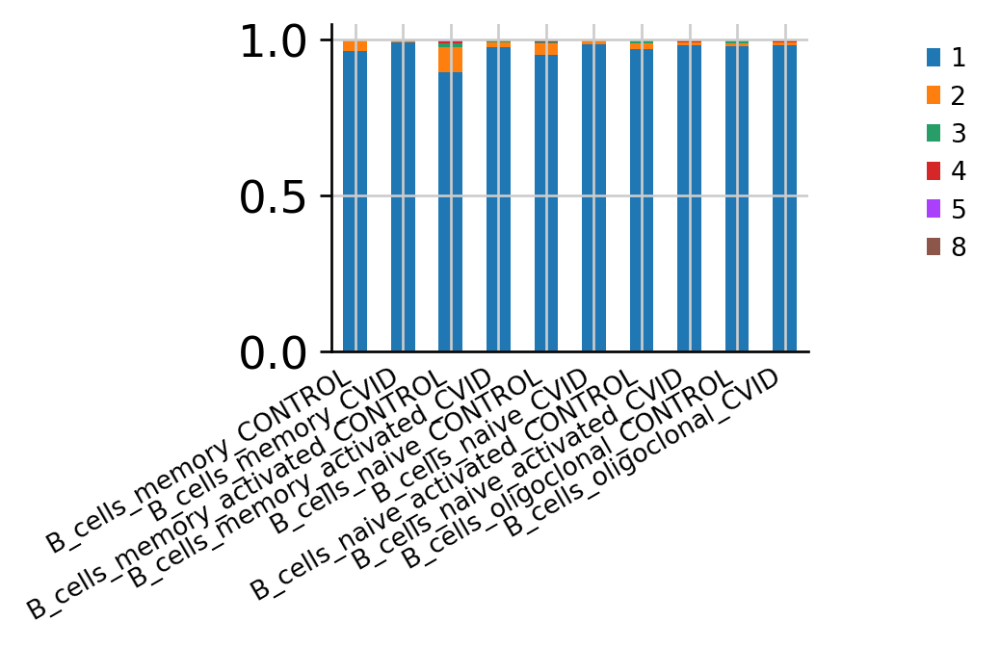

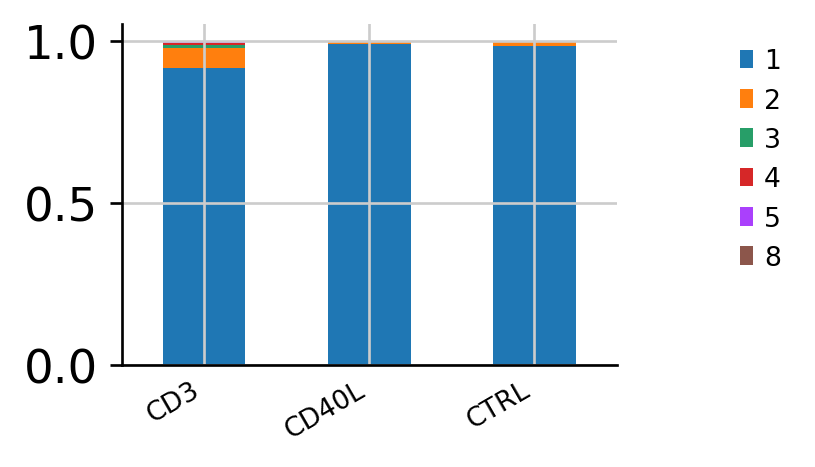

In [52]:
ir.pl.clonal_expansion(adata, groupby="condition", clip_at=1000, normalize=True)
ir.pl.clonal_expansion(adata, groupby="cell_type", clip_at=1000, normalize=True)
ir.pl.clonal_expansion(adata, groupby="celltype_condition", clip_at=1000, normalize=True)
ir.pl.clonal_expansion(adata, groupby="activation", clip_at=1000, normalize=True)


In [53]:
adata.obs['activation_condition'] = [i + '_' + j for i,j in zip(adata.obs['activation'], adata.obs['condition'])]

<AxesSubplot:>

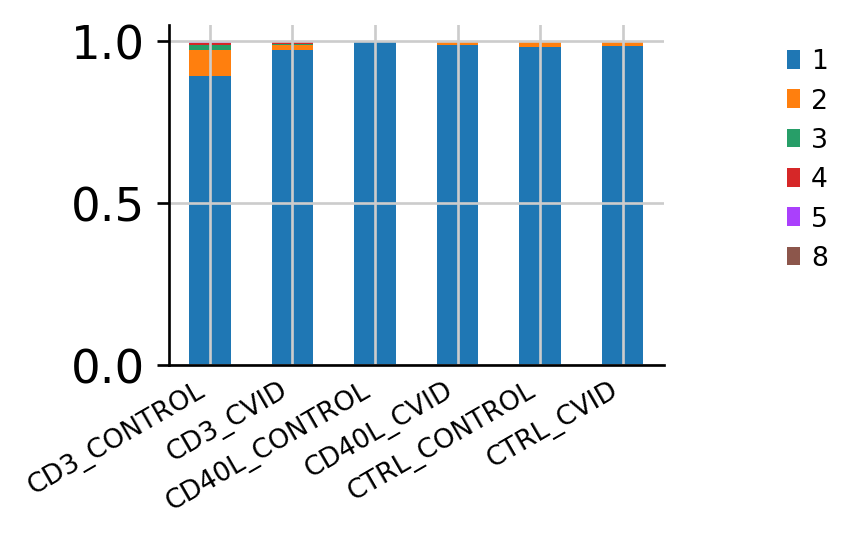

In [54]:
ir.pl.clonal_expansion(adata, groupby="activation_condition", clip_at=1000, normalize=True)


In [55]:
# TODO: how many clonotypes does each group contain (groups by activation and condition)
len(np.unique(adata.obs['clonotype']))

4973

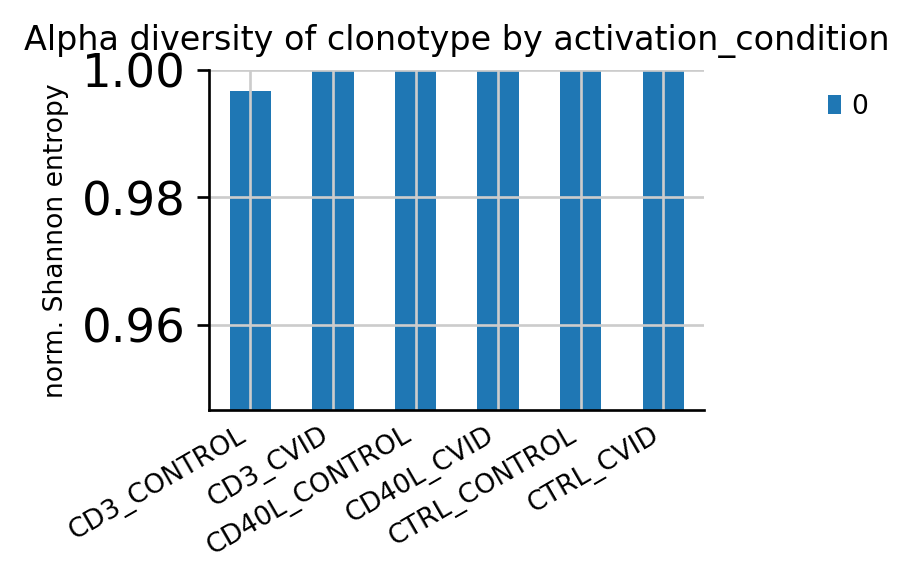

In [57]:
ax = ir.pl.alpha_diversity(adata, groupby="activation_condition")


In [58]:
adata.obs['clonal_expansion']

index
TCAGGATCAGTTTACG-1    1
GATCGCGTCCTACAGA-1    1
CGATCGGCACGGCCAT-1    1
CATGACACAACCGCCA-1    1
GACAGAGAGTGTTTGC-1    1
                     ..
CGGCTAGAGGACTGGT-1    1
CGACCTTAGTCAAGCG-1    1
TTAGGACGTTCGTCTC-1    1
GCGCAGTAGCCTCGTG-1    1
AAGACCTCAAGTAGTA-1    1
Name: clonal_expansion, Length: 5119, dtype: category
Categories (3, object): [1, 2, >= 3]

In [59]:
save_path

'/lustre/scratch117/cellgen/team292/aa22/adata_objects/202009_CVID_revision/202102_twins_reanalysis/'

In [60]:
adata.write(save_path + '20210218_adata_B_cells_with_BCR_information.h5ad')

... storing 'activation_condition' as categorical


In [ ]:
adata_twins.write(save_path + '20210218_adata_B_cells_with_BCR_information.h5ad')

# 2. Read in objects with all the results

In [5]:
adata = sc.read(save_path + '20210218_adata_B_cells_with_BCR_information.h5ad')

In [61]:
adata.obs['clonotype']

index
TCAGGATCAGTTTACG-1         0_BCR
GATCGCGTCCTACAGA-1         1_BCR
CGATCGGCACGGCCAT-1         2_BCR
CATGACACAACCGCCA-1         3_BCR
GACAGAGAGTGTTTGC-1         4_BCR
                         ...    
CGGCTAGAGGACTGGT-1      4967_BCR
CGACCTTAGTCAAGCG-1      4968_BCR
TTAGGACGTTCGTCTC-1    4969_no IR
GCGCAGTAGCCTCGTG-1      4970_BCR
AAGACCTCAAGTAGTA-1      4971_BCR
Name: clonotype, Length: 5119, dtype: category
Categories (4973, object): [0_BCR, 1_BCR, 2_BCR, 3_BCR, ..., 4968_BCR, 4969_no IR, 4970_BCR, 4971_BCR]

In [62]:
# which cells are in the expanded clonotypes (size >= 2)?
adata.obs['expanded_or_not_2_or_more'] = ['True' if value != '1' else 'False' for value in adata.obs['clonal_expansion']]
# which cells are in the expanded clonotypes (size >= 3)?
adata.obs['expanded_or_not_3_or_more'] = ['True' if value not in ['1','2'] else 'False' for value in adata.obs['clonal_expansion']]

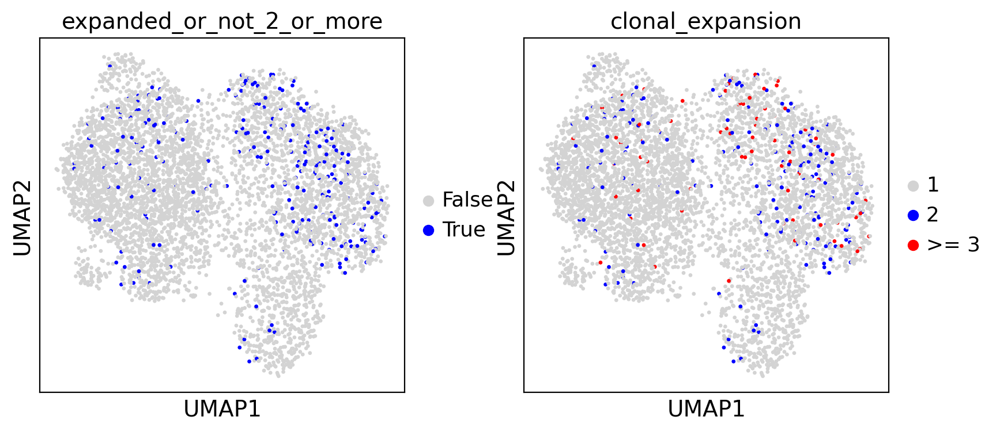

In [73]:
sc.pl.umap(adata, color=["expanded_or_not_2_or_more",
                         #'expanded_or_not_3_or_more',
                         "clonal_expansion"], palette=['lightgrey','blue','red'])

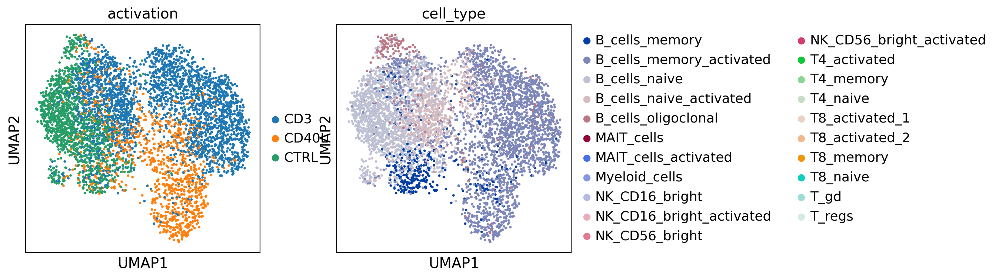

In [77]:
sc.pl.umap(adata, color=[#'clonotype_size', 'condition',
                         'activation', 'cell_type'], cmap='OrRd',
          ncols=3)


In [67]:
adata[adata.obs['condition'] == 'CVID'].obs['expanded_or_not_2_or_more'].value_counts()

False    2292
True       46
Name: expanded_or_not_2_or_more, dtype: int64

In [71]:
46 / len(adata[adata.obs['condition'] == 'CVID'].obs)

0.019674935842600515

In [68]:
adata[adata.obs['condition'] == 'CONTROL'].obs['expanded_or_not_2_or_more'].value_counts()

False    2568
True      213
Name: expanded_or_not_2_or_more, dtype: int64

In [69]:
213 / len(adata[adata.obs['condition'] == 'CONTROL'].obs)

0.07659115426105717

In [16]:
# another metric that we could compare: the number of expanded clonotypes
len(np.unique(adata[(adata.obs['expanded_or_not_2_or_more'] == 'True')
                   & (adata.obs['CVID_status'] == 'CVID')].obs['clonotype']))

/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:215: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_aa_alignment']['connectivities'] that happens to be dimensioned at n_obs×n_obs (14862×14862).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:215: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_aa_alignment']['distances'] that happens to be dimensioned at n_obs×n_obs (14862×14862).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:215: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_nt_identity']['connectivities'] that happens to be dimensioned at n_obs×n_obs (14862×14862).

These matrices should no

228

In [17]:
# another metric that we could compare: the number of expanded clonotypes
len(np.unique(adata[(adata.obs['expanded_or_not_2_or_more'] == 'True')
                   & (adata.obs['CVID_status'] == 'CONTROL')].obs['clonotype']))

208

In [20]:
# another metric that we could compare: the number of expanded clonotypes
len(np.unique(adata_twins[(adata_twins.obs['expanded_or_not_2_or_more'] == 'True')
                   & (adata_twins.obs['CVID_status'] == 'CVID')].obs['clonotype']))

/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:215: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_aa_alignment']['connectivities'] that happens to be dimensioned at n_obs×n_obs (1999×1999).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:215: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_aa_alignment']['distances'] that happens to be dimensioned at n_obs×n_obs (1999×1999).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  FutureWarning,
/opt/conda/lib/python3.7/site-packages/anndata/compat/__init__.py:215: FutureWarning: During AnnData slicing, found matrix at .uns['ir_neighbors_nt_identity']['connectivities'] that happens to be dimensioned at n_obs×n_obs (1999×1999).

These matrices should now be s

19

In [22]:
# another metric that we could compare: the number of expanded clonotypes
len(np.unique(adata_twins[(adata_twins.obs['expanded_or_not_2_or_more'] == 'True')
                   & (adata_twins.obs['CVID_status'] == 'CONTROL')].obs['clonotype']))

49

## Clonotype abundance


In [87]:
adata.obs['donor']

AAACCTGCAGATGGGT-1        CONTROL4
AAACCTGGTAGCGATG-1    CONTROL_twin
AAACCTGGTTAGATGA-1        CONTROL4
AAACGGGAGGATTCGG-1           CVID3
AAACGGGGTGCGCTTG-1           CVID3
                          ...     
TTTGGTTAGGTAAACT-1        CONTROL8
TTTGGTTTCTACCTGC-1          CVID36
TTTGTCAAGAAACCTA-1        CONTROL7
TTTGTCACACAGCGTC-1          CVID37
TTTGTCAGTAGTACCT-1        CONTROL7
Name: donor, Length: 18069, dtype: category
Categories (21, object): ['CONTROL1', 'CONTROL2', 'CONTROL3', 'CONTROL4', ..., 'CVID34', 'CVID36', 'CVID37', 'CVID_twin']

<AxesSubplot:title={'center':'Number of cells in CVID_status by donor'}, xlabel='CVID_status', ylabel='Number of cells'>

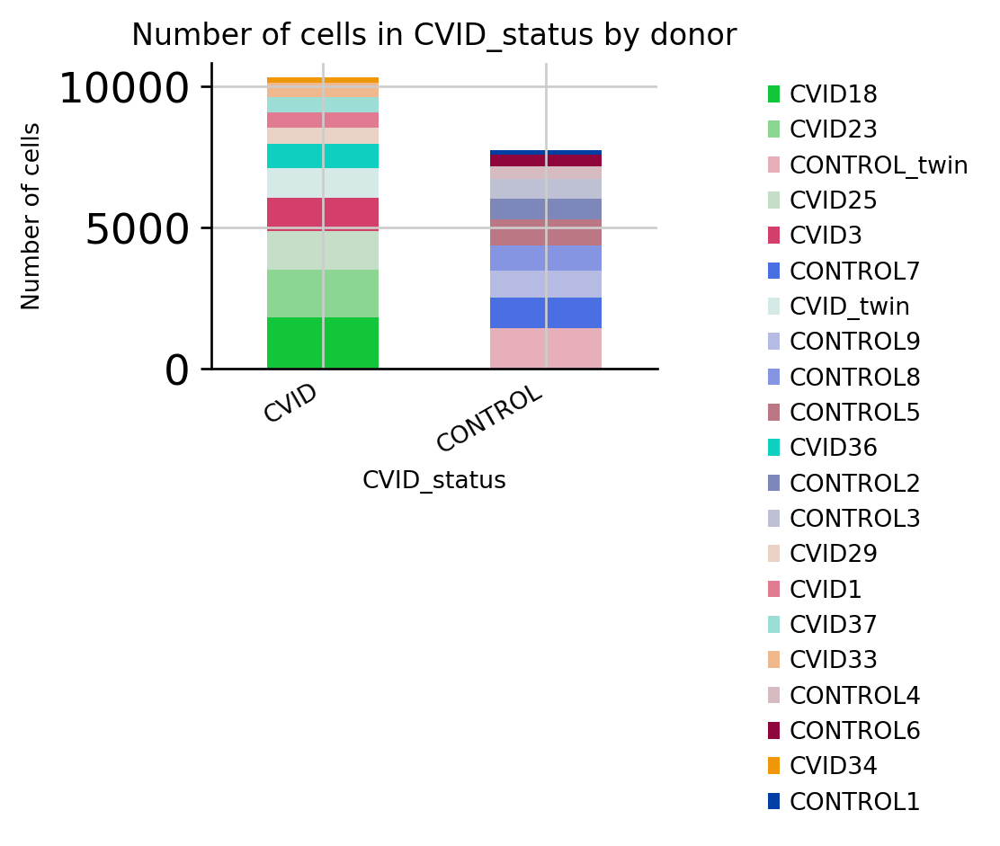

In [91]:
ir.pl.group_abundance(adata, groupby="CVID_status", target_col="donor", max_cols=20)


<AxesSubplot:title={'center':'Fraction of CVID_status in each clonotype'}, xlabel='clonotype', ylabel='Fraction of cells in sample'>

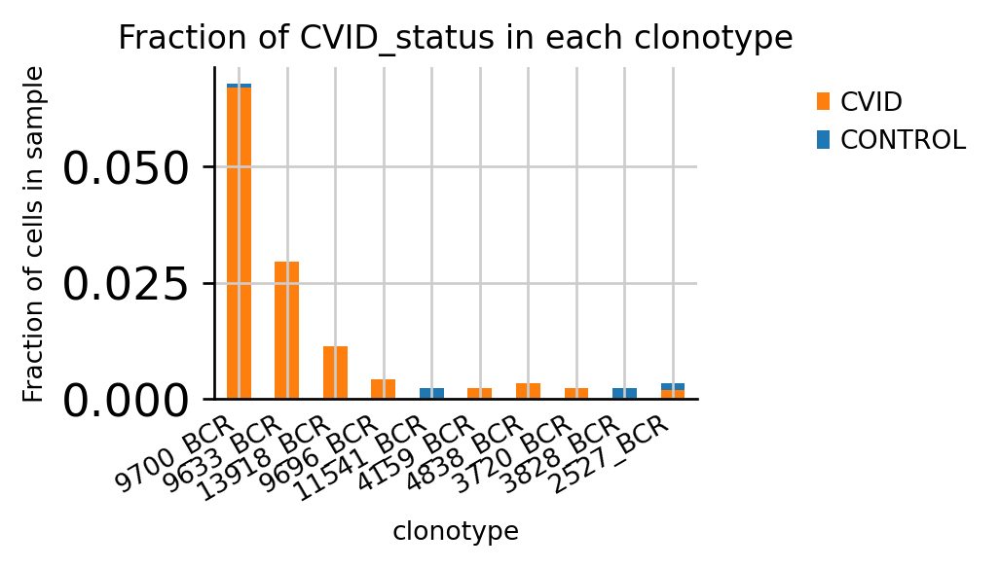

In [92]:
ir.pl.group_abundance(
    adata, groupby="clonotype", target_col="CVID_status", max_cols=10, normalize="sample"
)

# Gene usage


<AxesSubplot:title={'center':'Fraction of CVID_status in each IR_VJ_1_v_gene'}, xlabel='IR_VJ_1_v_gene', ylabel='Fraction of cells in CVID_status'>

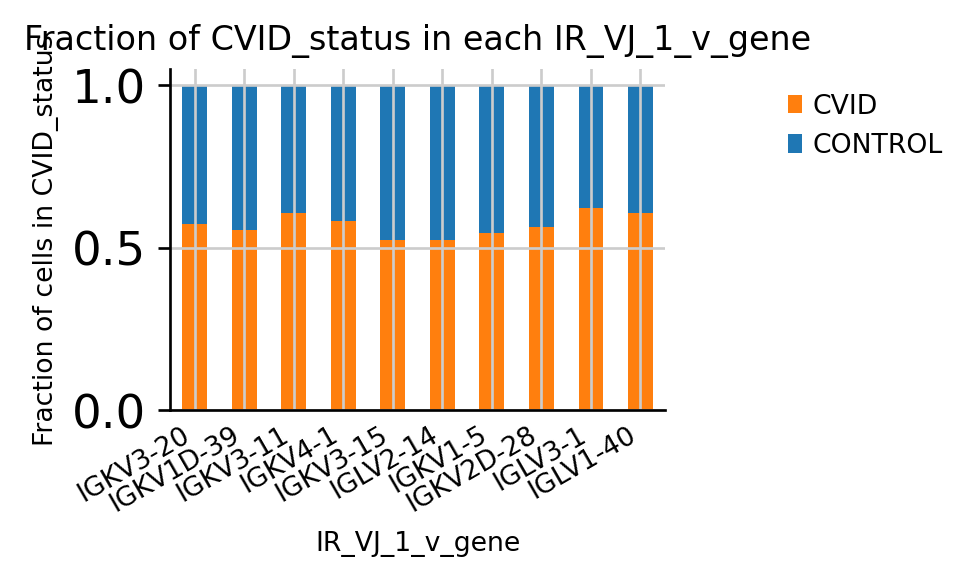

In [95]:
ir.pl.group_abundance(
    adata, groupby="IR_VJ_1_v_gene", target_col="CVID_status", normalize=True, max_cols=10
)

In [97]:
ir.pl.group_abundance(
    adata[
        adata.obs["IR_VDJ_1_v_gene"].isin(
            ["TRBV20-1", "TRBV7-2", "TRBV28", "TRBV5-1", "TRBV7-9"]
        ),
        :,
    ],
    groupby="cluster",
    target_col="IR_VDJ_1_v_gene",
    normalize=True,
)

ValueError: cannot call `vectorize` on size 0 inputs unless `otypes` is set

<AxesSubplot:>

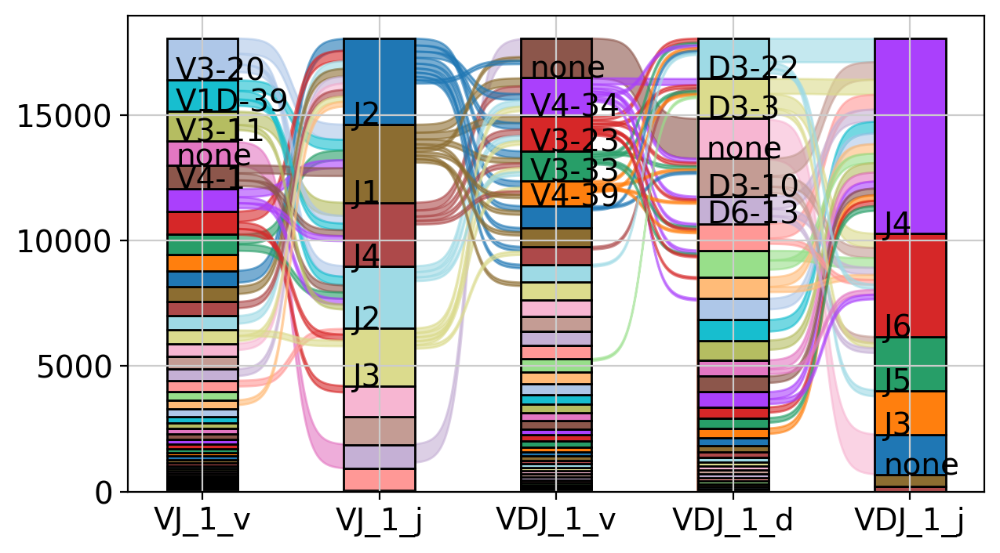

In [98]:
ir.pl.vdj_usage(adata, full_combination=False, max_segments=None, max_ribbons=30)


In [99]:
df, dst, lk = ir.tl.repertoire_overlap(adata, "sample", inplace=False)
df.head()

clonotype,0_BCR,1_BCR,2_BCR,3_BCR,4_BCR,5_BCR,6_BCR,7_BCR,8_BCR,9_BCR,...,17132_BCR,17133_BCR,17134_BCR,17135_BCR,17136_BCR,17137_BCR,17138_BCR,17139_BCR,17140_BCR,17141_BCR
sample,,,,,,,,,,,,,,,,,,,,,
35008_CV005_RV9039258_and_35008_CV005_RV9039282,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35008_CV005_RV9039259_and_35008_CV005_RV9039283,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35008_CV005_RV9039260_and_35008_CV005_RV9039284,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35008_CV005_RV9039261_and_35008_CV005_RV9039285,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35008_CV005_RV9039262_and_35008_CV005_RV9039286,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


/opt/conda/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


ValueError: cannot reshape array of size 104 into shape (2,80)

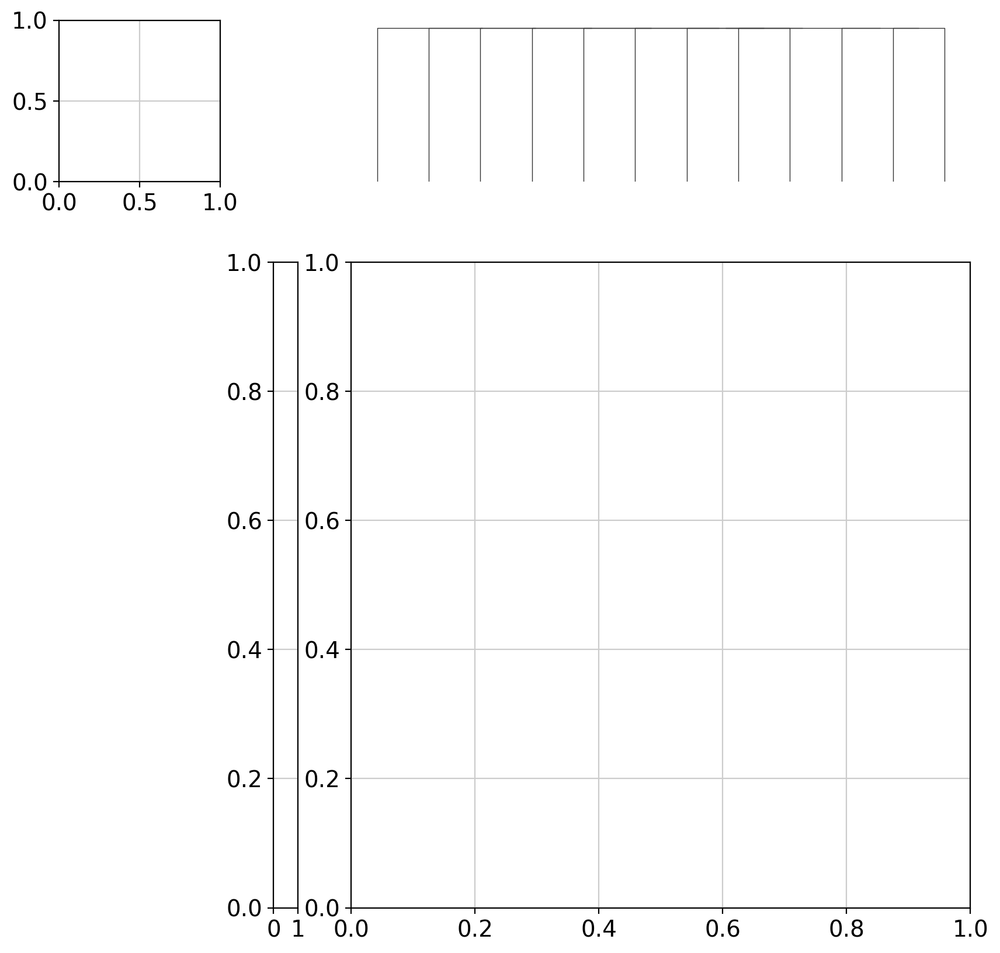

In [101]:
ir.pl.repertoire_overlap(adata, "sample", heatmap_cats=["donor", "CVID_status"])


In [103]:
freq, stat = ir.tl.clonotype_imbalance(
    adata,
    replicate_col="sample",
    groupby="CVID_status",
    case_label="CVID",
    control_label="CONTROL",
    inplace=False,
)
top_differential_clonotypes = stat["clonotype"].tolist()[:5]

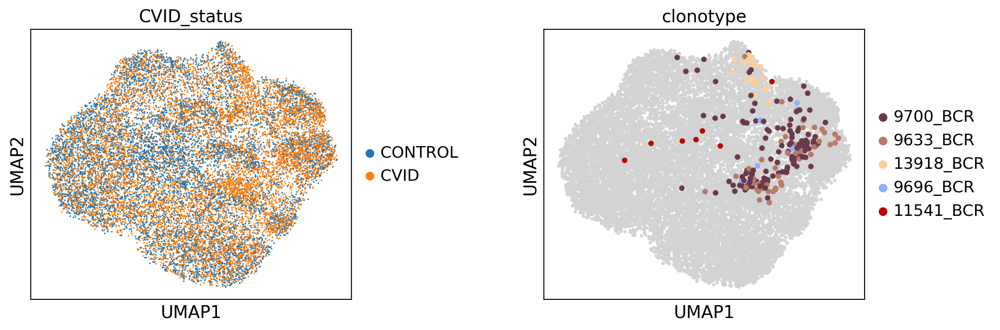

In [105]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4), gridspec_kw={"wspace": 0.6})
sc.pl.umap(adata, color="CVID_status", ax=ax1, show=False)
sc.pl.umap(
    adata,
    color="clonotype",
    groups=top_differential_clonotypes,
    ax=ax2,
    # increase size of highlighted dots
    size=[
        80 if c in top_differential_clonotypes else 30 for c in adata.obs["clonotype"]
    ],
)

No handles with labels found to put in legend.


<AxesSubplot:title={'center':'Repertoire overlap between CVID and CONTROL'}, xlabel='Clonotype size in CVID', ylabel='Clonotype size in CONTROL'>

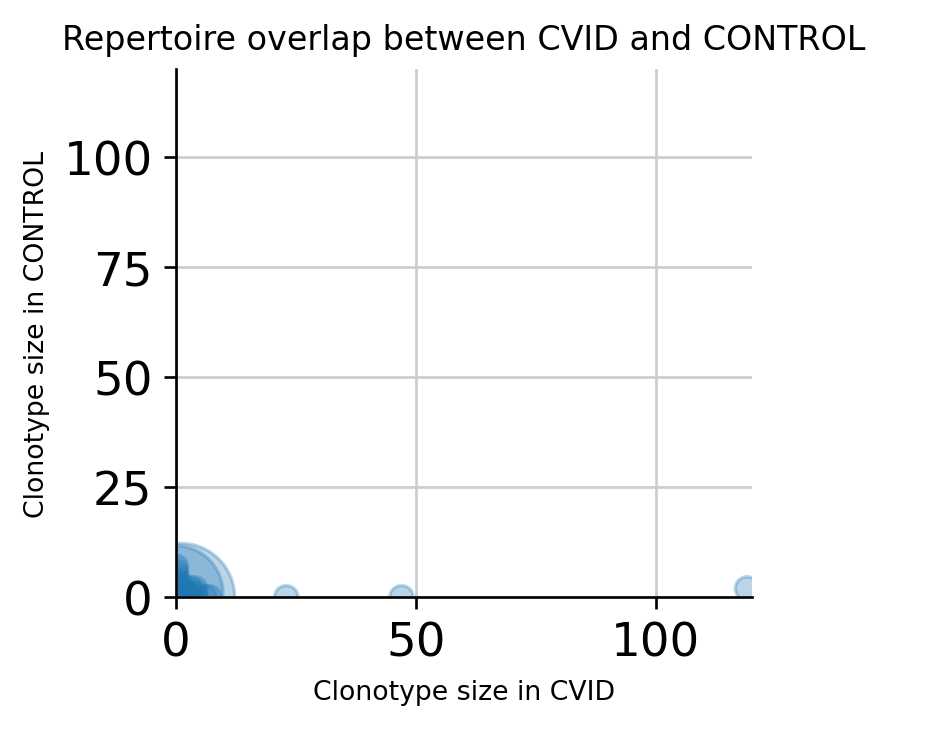

In [108]:
ir.tl.repertoire_overlap(adata, "CVID_status")
ir.pl.repertoire_overlap(
    adata, "CVID_status", pair_to_plot=["CVID", "CONTROL"], fig_kws={"dpi": 120}
)

In [112]:
# saving all calculated BCR information / metrics into a csv file
BCR_info_B_cells = pd.DataFrame(adata.obs.loc[:,['IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 
                 'IR_VJ_1_cdr3', 'IR_VJ_2_cdr3', 'IR_VDJ_1_cdr3', 'IR_VDJ_2_cdr3', 'IR_VJ_1_cdr3_nt', 
                 'IR_VJ_2_cdr3_nt', 'IR_VDJ_1_cdr3_nt', 'IR_VDJ_2_cdr3_nt', 'IR_VJ_1_expr', 
                 'IR_VJ_2_expr', 'IR_VDJ_1_expr', 'IR_VDJ_2_expr', 'IR_VJ_1_expr_raw', 
                 'IR_VJ_2_expr_raw', 'IR_VDJ_1_expr_raw', 'IR_VDJ_2_expr_raw', 'IR_VJ_1_v_gene', 
                 'IR_VJ_2_v_gene', 'IR_VDJ_1_v_gene', 'IR_VDJ_2_v_gene', 'IR_VJ_1_d_gene', 'IR_VJ_2_d_gene', 
                 'IR_VDJ_1_d_gene', 'IR_VDJ_2_d_gene', 'IR_VJ_1_j_gene', 'IR_VJ_2_j_gene', 'IR_VDJ_1_j_gene', 
                 'IR_VDJ_2_j_gene', 'IR_VJ_1_c_gene', 'IR_VJ_2_c_gene', 'IR_VDJ_1_c_gene', 'IR_VDJ_2_c_gene', 
                 'IR_VJ_1_junction_ins', 'IR_VJ_2_junction_ins', 'IR_VDJ_1_junction_ins', 'IR_VDJ_2_junction_ins', 
                 'has_ir', 'multi_chain', 'receptor_type', 'receptor_subtype', 'chain_pairing', 'clonotype', 
                 'clonotype_size', 'ct_cluster_aa_alignment', 'ct_cluster_aa_alignment_size', 
                 'ct_cluster_aa_alignment_same_v', 'ct_cluster_aa_alignment_same_v_size', 'clonal_expansion']])

BCR_info_B_cells.to_csv(save_path + '20210106_B_cells_BCR_metrics_scirpy.csv')

In [113]:
BCR_info_B_cells

,IR_VJ_1_locus,IR_VJ_2_locus,IR_VDJ_1_locus,IR_VDJ_2_locus,IR_VJ_1_cdr3,IR_VJ_2_cdr3,IR_VDJ_1_cdr3,IR_VDJ_2_cdr3,IR_VJ_1_cdr3_nt,IR_VJ_2_cdr3_nt,...,receptor_type,receptor_subtype,chain_pairing,clonotype,clonotype_size,ct_cluster_aa_alignment,ct_cluster_aa_alignment_size,ct_cluster_aa_alignment_same_v,ct_cluster_aa_alignment_same_v_size,clonal_expansion
AAACCTGCAGATGGGT-1,IGL,nan,nan,nan,CQSADSSGTYRSF,None,None,None,TGTCAATCAGCAGACAGCAGTGGTACTTATCGGAGCTTC,None,...,BCR,IGH+IGL,orphan VJ,0_BCR,1,0,15,0_IGLV3-25_nan_BCR,14,1
AAACCTGGTAGCGATG-1,IGL,nan,IGH,nan,CYSTDSSGNQGVF,None,CAKLAVAGDFDYW,None,TGTTACTCAACAGACAGCAGTGGTAATCAGGGGGTATTC,None,...,BCR,IGH+IGL,single pair,1_BCR,1,1,1,1_IGLV3-10_IGHV3-30_BCR,1,1
AAACCTGGTTAGATGA-1,IGL,nan,IGH,nan,CSSYTSSSTWVF,None,CARVYRGALWFDPW,None,TGCAGCTCATATACAAGCAGCAGCACTTGGGTGTTC,None,...,BCR,IGH+IGL,single pair,2_BCR,1,2,1,2_IGLV2-14_IGHV1-18_BCR,1,1
AAACGGGAGGATTCGG-1,IGL,nan,IGH,nan,CSSYTSSSAWVF,None,CARRGVEGYYYYMDVW,None,TGCAGCTCATATACAAGCAGCAGCGCTTGGGTGTTC,None,...,BCR,IGH+IGL,single pair,3_BCR,1,3,1,3_IGLV2-14_IGHV5-51_BCR,1,1
AAACGGGGTGCGCTTG-1,IGL,nan,IGH,nan,CQSYDSSLSGSVVF,None,CARVGDSSGYYSPDAFDIW,None,TGCCAGTCCTATGACAGCAGCCTGAGTGGTTCTGTGGTATTC,None,...,BCR,IGH+IGL,single pair,4_BCR,1,4,1,4_IGLV1-40_IGHV1-2_BCR,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGGTAAACT-1,IGL,nan,IGH,nan,CQAWDSSTVVF,None,CARDLSDYDFWSGPRGYYGMDVW,None,TGTCAGGCGTGGGACAGCAGCACTGTGGTATTC,None,...,BCR,IGH+IGL,single pair,17137_BCR,1,16624,1,16624_IGLV3-1_IGHV3-74_BCR,1,1
TTTGGTTTCTACCTGC-1,IGK,nan,IGH,nan,CQQSYSTPTF,None,CARVDTAMVPYFDYW,None,TGTCAACAGAGTTACAGTACCCCTACTTTT,None,...,BCR,IGH+IGK,single pair,17138_BCR,1,16625,1,16625_IGKV1D-39_IGHV4-31_BCR,1,1
TTTGTCAAGAAACCTA-1,IGL,IGK,IGH,nan,CSSYTSSSTLEVF,CQQRSDWPLTF,CARRKGGRVDYW,None,TGCAGCTCATATACAAGCAGCAGCACTCTCGAGGTCTTC,TGTCAGCAGCGTAGCGACTGGCCGCTCACTTTC,...,BCR,ambiguous,ambiguous,17139_BCR,1,16626,1,16626_IGLV2-14_IGHV3-66_BCR,1,1
TTTGTCACACAGCGTC-1,IGL,nan,IGH,nan,CGTWDSSLSAGVF,None,CASSGYYYRFFDYW,None,TGCGGAACATGGGATAGCAGCCTGAGTGCTGGGGTATTC,None,...,BCR,IGH+IGL,single pair,17140_BCR,1,16627,1,16627_IGLV1-51_IGHV1-69_BCR,1,1
